<a href="https://colab.research.google.com/github/goksubektas/road-segmentation-with-U-Net-over-aerial-image/blob/main/road_segmentation1.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import pandas as pd
import os

In [ ]:
from google.colab import drive
drive.mount('/content/gdrive')

Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).


In [ ]:
!ls


gdrive	sample_data


In [ ]:
os.environ['KAGGLE_CONFIG_DIR'] = "/content/gdrive/MyDrive/Kaggle/"

In [ ]:
%cd "/content/gdrive/MyDrive/Kaggle/"

/content/gdrive/MyDrive/Kaggle


In [ ]:
!kaggle datasets download -d balraj98/massachusetts-roads-dataset

  9% 514M/5.76G [00:05<00:56, 99.9MB/s]
User cancelled operation


In [ ]:
!unzip \*.zip  && rm *.zip

Archive:  massachusetts-roads-dataset.zip
  End-of-central-directory signature not found.  Either this file is not
  a zipfile, or it constitutes one disk of a multi-part archive.  In the
  latter case the central directory and zipfile comment will be found on
  the last disk(s) of this archive.
unzip:  cannot find zipfile directory in one of *.zip or
        *.zip.zip, and cannot find massachusetts-roads-dataset.zip.ZIP, period.

No zipfiles found.


In [ ]:
import os, cv2
import numpy as np
import pandas as pd
import random, tqdm
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

import warnings
warnings.filterwarnings("ignore")

import torch
import torch.nn as nn
from torch.utils.data import DataLoader
import albumentations as album

In [ ]:
!pip install --upgrade opencv-python
!pip install --upgrade albumentations

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
!pip install -q -U segmentation-models-pytorch albumentations > /dev/null

import segmentation_models_pytorch as smp

In [ ]:
DATA_DIR = '/content/gdrive/MyDrive/Kaggle/tiff/'

x_train_dir = os.path.join(DATA_DIR, 'train')
y_train_dir = os.path.join(DATA_DIR, 'train_labels')

x_valid_dir = os.path.join(DATA_DIR, 'val')
y_valid_dir = os.path.join(DATA_DIR, 'val_labels')

x_test_dir = os.path.join(DATA_DIR, 'test')
y_test_dir = os.path.join(DATA_DIR, 'test_labels')

In [ ]:
class_dict = pd.read_csv("/content/gdrive/MyDrive/Kaggle/label_class_dict.csv")
# sınıf adlarının alınması
class_names = class_dict['name'].tolist()
# sınıf RGB değerleriinin alınması
class_rgb_values = class_dict[['r','g','b']].values.tolist()

print('All dataset classes and their corresponding RGB values in labels:')
print('Class Names: ', class_names)
print('Class RGB values: ', class_rgb_values)

All dataset classes and their corresponding RGB values in labels:
Class Names:  ['background', 'road']
Class RGB values:  [[0, 0, 0], [255, 255, 255]]


In [ ]:
# Çok sayıda sınıf içeren veri kümelerinde belirli sınıfları kısa listeye almak için kullanışlıdır
select_classes = ['background', 'road']

# Gerekli sınıfların RGB değerlerinin alınması
select_class_indices = [class_names.index(cls.lower()) for cls in select_classes]
select_class_rgb_values =  np.array(class_rgb_values)[select_class_indices]

print('Selected classes and their corresponding RGB values in labels:')
print('Class Names: ', class_names)
print('Class RGB values: ', class_rgb_values)

Selected classes and their corresponding RGB values in labels:
Class Names:  ['background', 'road']
Class RGB values:  [[0, 0, 0], [255, 255, 255]]


In [ ]:
# veri görselleştirme için yardımcı fonksiyon
def visualize(**images):
    """
    Plot images in one row
    """
    n_images = len(images)
    plt.figure(figsize=(20,8))
    for idx, (name, image) in enumerate(images.items()):
        plt.subplot(1, n_images, idx + 1)
        plt.xticks([]); 
        plt.yticks([])
        # parametre adlarından başlıkların alınması
        plt.title(name.replace('_',' ').title(), fontsize=20)
        plt.imshow(image)
    plt.show()

# Etikette one hot encoding gerçekleştirme
def one_hot_encode(label, label_values):
    """
    Görüntü etiketi dizisini one hot encoding formatına dönüştüren her piksel 
    değerini uzunluk num_classes vektörüyle değiştirir
    
        
    # Returns
        Girişle aynı genişlik ve yüksekliğe sahip bir 2B dizi
    """
    semantic_map = []
    for colour in label_values:
        equality = np.equal(label, colour)
        class_map = np.all(equality, axis = -1)
        semantic_map.append(class_map)
    semantic_map = np.stack(semantic_map, axis=-1)

    return semantic_map
    
# Etiketlerde ve predlerde one-hot-encoding gerçekleştirme
def reverse_one_hot(image):
    """
    her piksel değerinin olduğu yalnızca 1 kanallı 
    bir 2B diziye sınıflandırılmış sınıf anahtarı
    
        
    # Returns
        her piksel değerinin olduğu yalnızca 1 
        kanallı bir 2B dizi
    """
    x = np.argmax(image, axis = -1)
    return x
    
# çıkışlarda renk kodlaması
def colour_code_segmentation(image, label_values):
    """
    1 kanallı bir sınıf anahtarı dizisi verildiğinde,
     segmentasyon sonuçlarını renkle kodlama
    # Arguments
        image: single channel array where each value represents the class key.
        label_values

    # Returns
        Segmentasyon görselleştirmesi için renk kodlu görüntü
    """
    colour_codes = np.array(label_values)
    x = colour_codes[image.astype(int)]

    return x

In [ ]:
class RoadsDataset(torch.utils.data.Dataset):

    """Görüntülerin okunması, büyütme ve ön işleme dönüşümlerinin uygulanması.
    
    Args:
        images_dir (str): resimler klasörüne giden yol
        masks_dir (str): segmentasyon maskeleri klasörüne giden yol
        class_rgb_values (list): Segmentasyon maskesinden çıkarılacak belirli sınıfların RGB değerleri
        augmentation (albumentations.Compose): veri dönüştürme
        preprocessing (albumentations.Compose): veri ön işleme 
            ( noralization, shape manipulation, vb.)
    
    """
    
    def __init__(
            self, 
            images_dir, 
            masks_dir, 
            class_rgb_values=None, 
            augmentation=None, 
            preprocessing=None,
    ):

        self.image_paths = [os.path.join(images_dir, image_id) for image_id in sorted(os.listdir(images_dir))]
        self.mask_paths = [os.path.join(masks_dir, image_id) for image_id in sorted(os.listdir(masks_dir))]

        self.class_rgb_values = class_rgb_values
        self.augmentation = augmentation
        self.preprocessing = preprocessing
    
    def __getitem__(self, i):
        
        # görüntülerin ve maskelerin okunması
        image = cv2.cvtColor(cv2.imread(self.image_paths[i]), cv2.COLOR_BGR2RGB)
        mask = cv2.cvtColor(cv2.imread(self.mask_paths[i]), cv2.COLOR_BGR2RGB)
        
        # one-hot-encode maskesi
        mask = one_hot_encode(mask, self.class_rgb_values).astype('float')
        
        # augmentations uygulanması
        if self.augmentation:
            sample = self.augmentation(image=image, mask=mask)
            image, mask = sample['image'], sample['mask']
        
        #  preprocessing uygulanması
        if self.preprocessing:
            sample = self.preprocessing(image=image, mask=mask)
            image, mask = sample['image'], sample['mask']
            
        return image, mask
        
    def __len__(self):
        # return uzunluğu
        return len(self.image_paths)

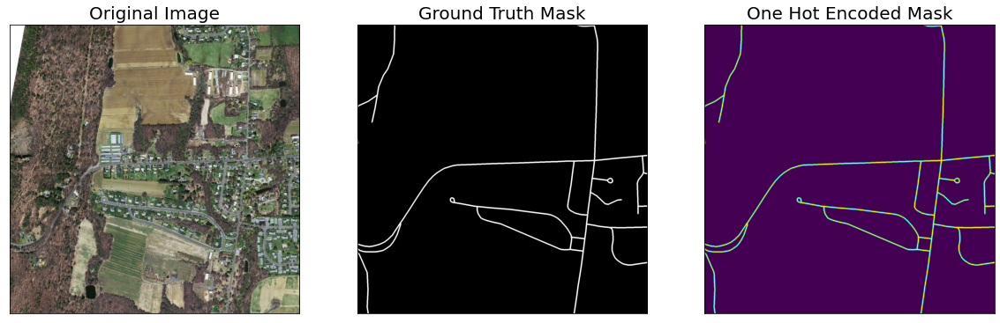

In [ ]:
dataset = RoadsDataset(x_train_dir, y_train_dir, class_rgb_values=select_class_rgb_values)
random_idx = random.randint(0, len(dataset)-1)
image, mask = dataset[2]

visualize(
    original_image = image,
    ground_truth_mask = colour_code_segmentation(reverse_one_hot(mask), select_class_rgb_values),
    one_hot_encoded_mask = reverse_one_hot(mask)
)

In [ ]:
def get_training_augmentation():
    train_transform = [    
        album.RandomCrop(height=256, width=256, always_apply=True),
        album.OneOf(
            [
                album.HorizontalFlip(p=1),
                album.VerticalFlip(p=1),
                album.RandomRotate90(p=1),
            ],
            p=0.75,
        ),
    ]
    return album.Compose(train_transform)


def get_validation_augmentation():   
    # Resmin 32'ye bölünebilmesini sağlamak için yeterli dolgunun eklenmesi
    test_transform = [
        album.PadIfNeeded(min_height=1536, min_width=1536, always_apply=True, border_mode=0),
    ]
    return album.Compose(test_transform)


def to_tensor(x, **kwargs):
    return x.transpose(2, 0, 1).astype('float32')


def get_preprocessing(preprocessing_fn=None):
    """Ön işleme dönüşümü oluşturma   
    Args:
        preprocessing_fn (callable): veri normalleştirme işlevi 
        (önceden eğitilmiş her sinir ağı için özel olabilir)
    Return:
        transform: albumentations.Compose
    """   
    _transform = []
    if preprocessing_fn:
        _transform.append(album.Lambda(image=preprocessing_fn))
    _transform.append(album.Lambda(image=to_tensor, mask=to_tensor))
        
    return album.Compose(_transform)

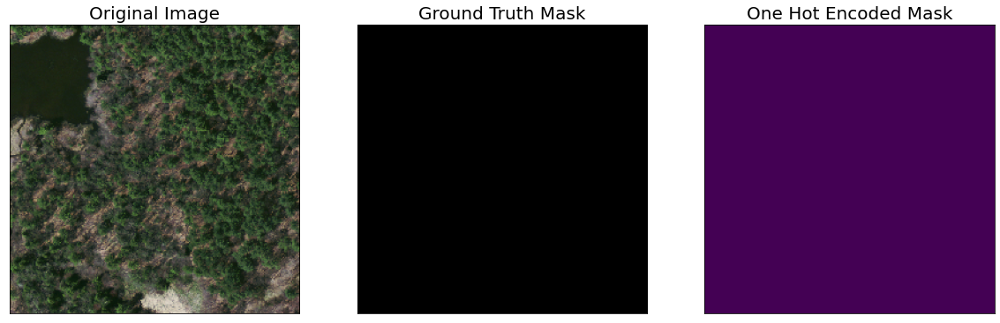

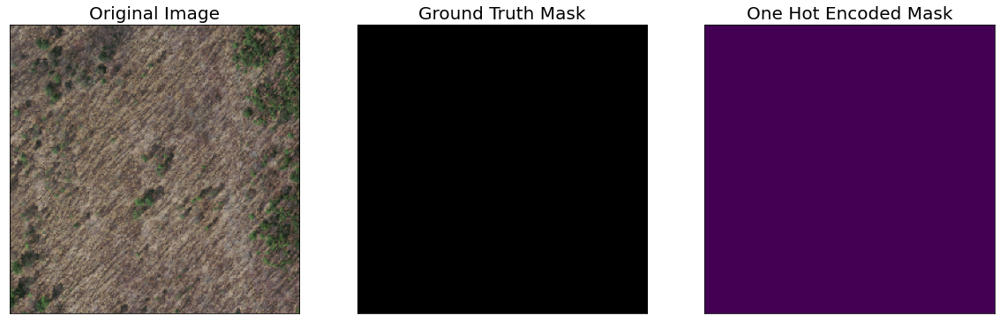

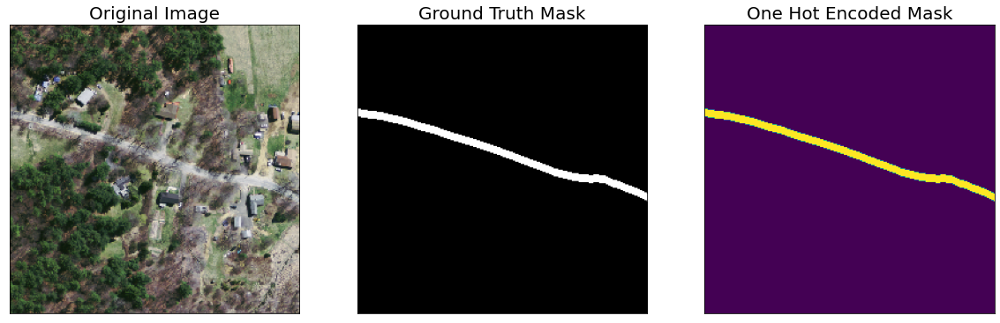

In [ ]:
augmented_dataset = RoadsDataset(
    x_train_dir, y_train_dir, 
    augmentation=get_training_augmentation(),
    class_rgb_values=select_class_rgb_values,
)

random_idx = random.randint(0, len(augmented_dataset)-1)

# Rastgele bir görüntü/maske çifti üzerinde farklı büyütmeler (256*256 kırpma)
for i in range(3):
    image, mask = augmented_dataset[random_idx]
    visualize(
        original_image = image,
        ground_truth_mask = colour_code_segmentation(reverse_one_hot(mask), select_class_rgb_values),
        one_hot_encoded_mask = reverse_one_hot(mask)
    )

In [ ]:
ENCODER = 'resnet50'
ENCODER_WEIGHTS = 'imagenet'
CLASSES = select_classes
ACTIVATION = 'sigmoid' # logits için None  ya da çok sınıflı segmentasyoniçin'softmax2d'

# önceden eğitilmiş kodlayıcı ile segmentasyon modeli oluşturma
model = smp.Unet(
    encoder_name=ENCODER, 
    encoder_weights=ENCODER_WEIGHTS, 
    classes=len(CLASSES), 
    activation=ACTIVATION,
)

preprocessing_fn = smp.encoders.get_preprocessing_fn(ENCODER, ENCODER_WEIGHTS)

In [ ]:
# Train ve val veri kümelerinden örneklerin alınması
train_dataset = RoadsDataset(
    x_train_dir, y_train_dir, 
    augmentation=get_training_augmentation(),
    preprocessing=get_preprocessing(preprocessing_fn),
    class_rgb_values=select_class_rgb_values,
)

valid_dataset = RoadsDataset(
    x_valid_dir, y_valid_dir, 
    augmentation=get_validation_augmentation(), 
    preprocessing=get_preprocessing(preprocessing_fn),
    class_rgb_values=select_class_rgb_values,
)

# Train ve val veri yükleyicilerinin elde edilmesi
train_loader = DataLoader(train_dataset, batch_size=16, shuffle=True, num_workers=4)
valid_loader = DataLoader(valid_dataset, batch_size=1, shuffle=False, num_workers=4)

In [ ]:
# Modeli eğitmel için bayrak True yapıldı.False olsaydı,yalnızca tahmin gerçekleştirilecekti.
TRAINING = True

# Eğitim sayısı
EPOCHS = 100

# Cihaz: `cuda` ya da `cpu`
DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# kayıp fonksiyonun tanımlanması
loss = smp.utils.losses.DiceLoss()

# metriklerin tanımlanması
metrics = [
    smp.utils.metrics.IoU(threshold=0.5),
    smp.utils.metrics.Fscore(threshold=0.5),
    smp.utils.metrics.Accuracy(threshold=0.5),
    smp.utils.metrics.Recall(threshold=0.5),
    smp.utils.metrics.Precision(threshold=0.5),
]

# optimize 
optimizer = torch.optim.Adam([ 
    dict(params=model.parameters(), lr=0.00001),
])

# öğrenme oranı
lr_scheduler = torch.optim.lr_scheduler.CosineAnnealingWarmRestarts(
    optimizer, T_0=1, T_mult=2, eta_min=5e-5,
)

# önceki adımdan en iyi kaydedilmiş modelin kontrol noktasına yüklenmesi
if os.path.exists('../input/unet-resnet50-frontend-road-segmentation-pytorch/best_model.pth'):
    model = torch.load('../input/unet-resnet50-frontend-road-segmentation-pytorch/best_model.pth', map_location=DEVICE)

In [ ]:
train_epoch = smp.utils.train.TrainEpoch(
    model, 
    loss=loss, 
    metrics=metrics, 
    optimizer=optimizer,
    device=DEVICE,
    verbose=True,
)

valid_epoch = smp.utils.train.ValidEpoch(
    model, 
    loss=loss, 
    metrics=metrics, 
    device=DEVICE,
    verbose=True,
)

In [ ]:
%%time

if TRAINING:

    best_iou_score = 0.0
    train_logs_list, valid_logs_list = [], []

    for i in range(0, EPOCHS):

        # Eğitim ve doğrulamanın gerçekleştirilmesi
        print('\nEpoch: {}'.format(i))
        train_logs = train_epoch.run(train_loader)
        valid_logs = valid_epoch.run(valid_loader)
        train_logs_list.append(train_logs)
        valid_logs_list.append(valid_logs)

        # Daha iyi bir IoU puanı elde edilirse modelin kaydedilmesi
        if best_iou_score < valid_logs['iou_score']:
            best_iou_score = valid_logs['iou_score']
            torch.save(model, './best_model.pth')
            print('Model saved!')


Epoch: 0
valid: 100%|██████████| 14/14 [00:09<00:00,  1.49it/s, dice_loss - 0.5432, iou_score - 0.3282, fscore - 0.4859, accuracy - 0.5637, recall - 0.4434, precision - 0.5426]
Model saved!

Epoch: 1
valid: 100%|██████████| 14/14 [00:05<00:00,  2.38it/s, dice_loss - 0.4898, iou_score - 0.5407, fscore - 0.6989, accuracy - 0.6826, recall - 0.7801, precision - 0.6344]
Model saved!

Epoch: 2
valid: 100%|██████████| 14/14 [00:05<00:00,  2.43it/s, dice_loss - 0.4749, iou_score - 0.5985, fscore - 0.7458, accuracy - 0.7335, recall - 0.8298, precision - 0.679]
Model saved!

Epoch: 3
valid: 100%|██████████| 14/14 [00:05<00:00,  2.40it/s, dice_loss - 0.4683, iou_score - 0.6153, fscore - 0.7521, accuracy - 0.7701, recall - 0.7611, precision - 0.7492]
Model saved!

Epoch: 4
valid: 100%|██████████| 14/14 [00:05<00:00,  2.33it/s, dice_loss - 0.4607, iou_score - 0.6103, fscore - 0.7395, accuracy - 0.7808, recall - 0.6972, precision - 0.798]

Epoch: 5
valid: 100%|██████████| 14/14 [00:05<00:00,  2.35i

In [ ]:
# en iyi kaydedilen model kontrol noktasının yüklenmesi
if os.path.exists('./best_model.pth'):
    best_model = torch.load('./best_model.pth', map_location=DEVICE)
    print('Loaded UNet model from this run.')

# önceki adımdan en iyi kaydedilmiş model kontrol noktasının yüklenmesi
elif os.path.exists('../input/unet-resnet50-frontend-road-segmentation-pytorch/best_model.pth'):
    best_model = torch.load('../input/unet-resnet50-frontend-road-segmentation-pytorch/best_model.pth', map_location=DEVICE)
    print('Loaded UNet model from a previous commit.')

Loaded UNet model from this run.


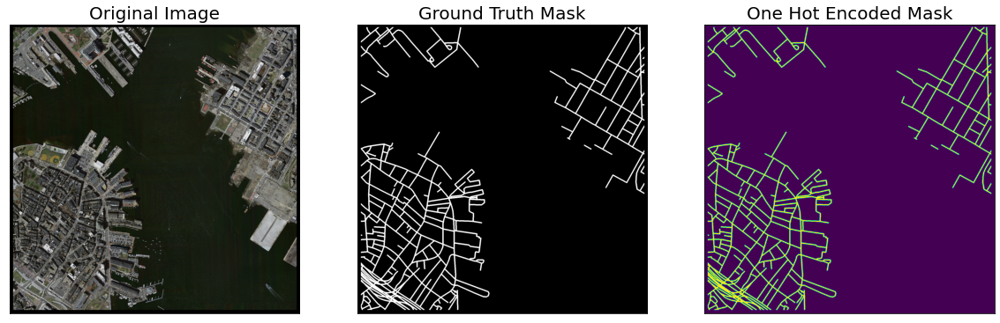

In [ ]:
# UNet modeliyle kullanılacak test veri yükleyicisini oluşturma (with preprocessing operation: to_tensor(...))
test_dataset = RoadsDataset(
    x_test_dir, 
    y_test_dir, 
    augmentation=get_validation_augmentation(), 
    preprocessing=get_preprocessing(preprocessing_fn),
    class_rgb_values=select_class_rgb_values,
)

test_dataloader = DataLoader(test_dataset)

# görselleştirme için test veri seti (without preprocessing transformations)
test_dataset_vis = RoadsDataset(
    x_test_dir, y_test_dir, 
    augmentation=get_validation_augmentation(),
    class_rgb_values=select_class_rgb_values,
)

# rastgele bir test görüntüsü/maske dizinin alınması
random_idx = random.randint(0, len(test_dataset_vis)-1)
image, mask = test_dataset_vis[random_idx]

visualize(
    original_image = image,
    ground_truth_mask = colour_code_segmentation(reverse_one_hot(mask), select_class_rgb_values),
    one_hot_encoded_mask = reverse_one_hot(mask)
)


In [ ]:
# dolgulu görüntüyü / maskeyi orijinal görüntü karartacak şekilde ortadan kırpma 
def crop_image(image, target_image_dims=[1500,1500,3]):
   
    target_size = target_image_dims[0]
    image_size = len(image)
    padding = (image_size - target_size) // 2

    if padding<0:
        return image

    return image[
        padding:image_size - padding,
        padding:image_size - padding,
        :,
    ]

In [ ]:
sample_preds_folder = 'sample_predictions/'
if not os.path.exists(sample_preds_folder):
    os.makedirs(sample_preds_folder)

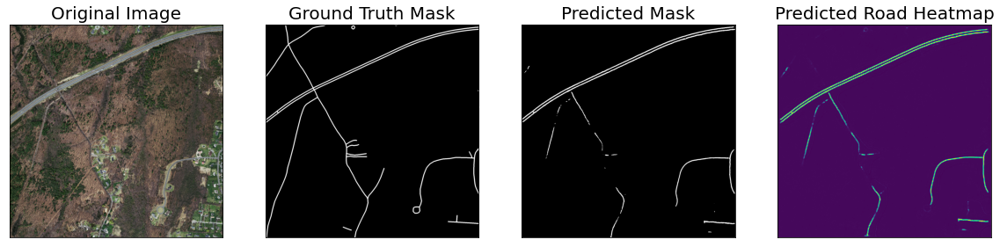

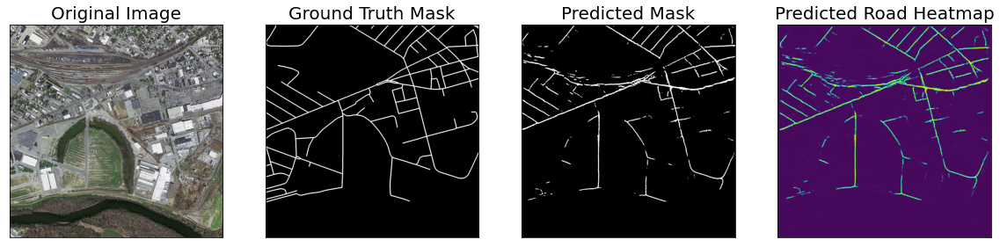

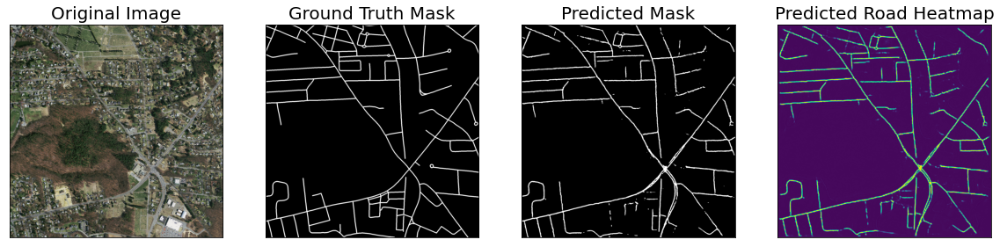

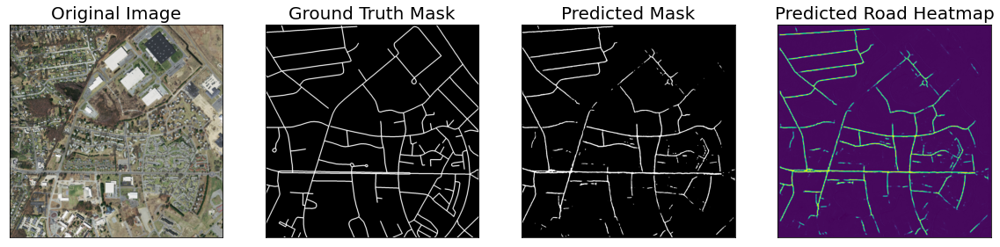

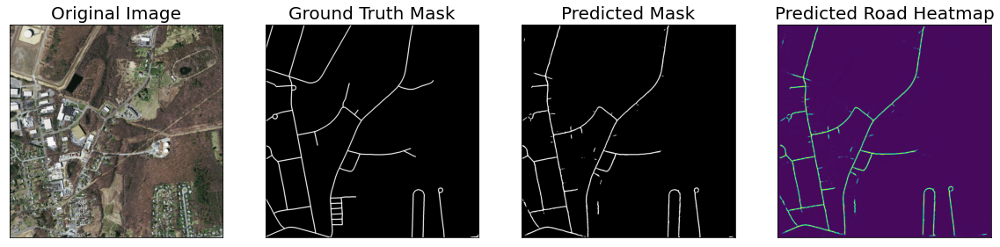

...

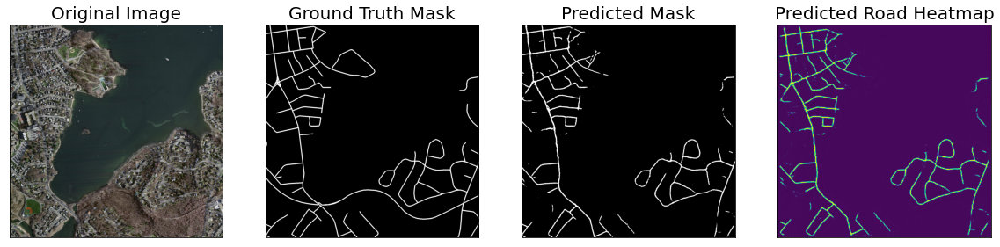

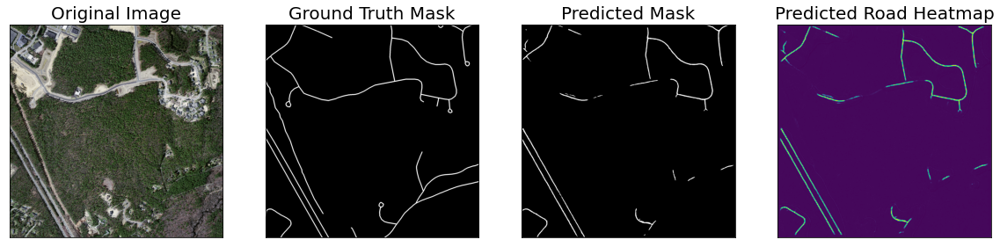

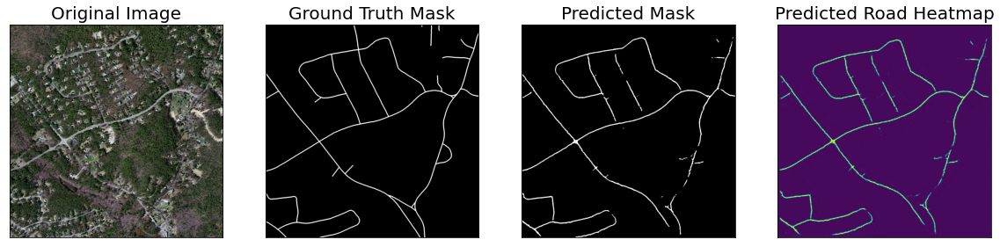

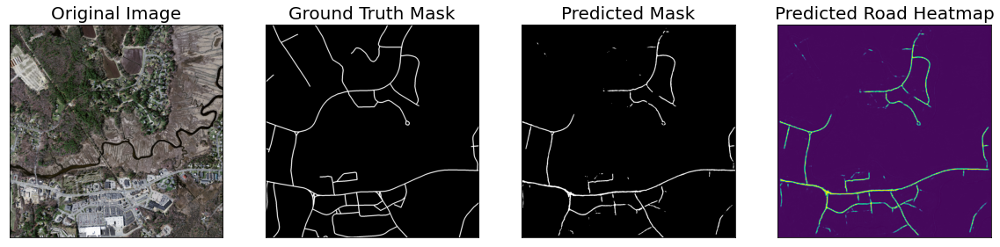

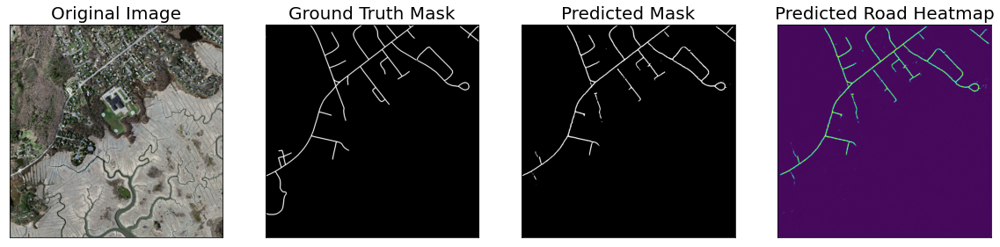

In [ ]:
for idx in range(len(test_dataset)):

    image, gt_mask = test_dataset[idx]
    image_vis = crop_image(test_dataset_vis[idx][0].astype('uint8'))
    x_tensor = torch.from_numpy(image).to(DEVICE).unsqueeze(0)
    # Test görüntüsünün tahmini
    pred_mask = best_model(x_tensor)
    pred_mask = pred_mask.detach().squeeze().cpu().numpy()
    # Pred_mask'i "CHW" biçiminden "HWC" biçimine dönüştürme
    pred_mask = np.transpose(pred_mask,(1,2,0))
    # Yola karşılık gelen tahmin kanal
    pred_road_heatmap = pred_mask[:,:,select_classes.index('road')]
    pred_mask = crop_image(colour_code_segmentation(reverse_one_hot(pred_mask), select_class_rgb_values))
    # gt_mask'i "CHW" biçiminden "HWC" biçimine dönüştürme
    gt_mask = np.transpose(gt_mask,(1,2,0))
    gt_mask = crop_image(colour_code_segmentation(reverse_one_hot(gt_mask), select_class_rgb_values))
    cv2.imwrite(os.path.join(sample_preds_folder, f"sample_pred_{idx}.png"), np.hstack([image_vis, gt_mask, pred_mask])[:,:,::-1])
    
    visualize(
        original_image = image_vis,
        ground_truth_mask = gt_mask,
        predicted_mask = pred_mask,
        predicted_road_heatmap = pred_road_heatmap
    )

In [ ]:
test_epoch = smp.utils.train.ValidEpoch(
    model,
    loss=loss, 
    metrics=metrics, 
    device=DEVICE,
    verbose=True,
)

valid_logs = test_epoch.run(test_dataloader)
print("Evaluation on Test Data: ")
print(f"IoU Score: {valid_logs['iou_score']:.4f}")
print(f" Dice Loss: {valid_logs['dice_loss']:.4f}")
print(f"Fscore: {valid_logs['fscore']:.4f}")
print(f"Accuracy: {valid_logs['accuracy']:.4f}")
print(f"Recall: {valid_logs['recall']:.4f}")

valid: 100%|██████████| 49/49 [00:26<00:00,  1.85it/s, dice_loss - 0.09838, iou_score - 0.9089, fscore - 0.9521, accuracy - 0.9532, recall - 0.9753, precision - 0.9299]
Evaluation on Test Data: 
IoU Score: 0.9089
 Dice Loss: 0.0984
Fscore: 0.9521
Accuracy: 0.9532
Recall: 0.9753


In [ ]:
train_logs_df = pd.DataFrame(train_logs_list)
valid_logs_df = pd.DataFrame(valid_logs_list)
train_logs_df.T

,0,1,2,3,4,5,6,7,8,9,...,90,91,92,93,94,95,96,97,98,99
dice_loss,0.593983,0.514260,0.486728,0.461523,0.445421,0.431761,0.417486,0.404263,0.391504,0.382045,...,0.096530,0.094779,0.092726,0.092843,0.090933,0.088940,0.088499,0.087292,0.085306,0.084661
iou_score,0.188084,0.442568,0.555439,0.630050,0.669774,0.666610,0.669909,0.679805,0.703734,0.729537,...,0.937629,0.938631,0.940248,0.937265,0.938413,0.940502,0.938961,0.938896,0.940683,0.939581
fscore,0.304958,0.611831,0.713836,0.772632,0.801993,0.799742,0.802118,0.809176,0.825809,0.843304,...,0.967732,0.968265,0.969139,0.967527,0.968156,0.969286,0.968444,0.968433,0.969378,0.968805
accuracy,0.483702,0.622265,0.710887,0.778146,0.816156,0.817662,0.819377,0.824409,0.838410,0.853994,...,0.967754,0.968284,0.969159,0.967545,0.968174,0.969305,0.968461,0.968452,0.969397,0.968823
recall,0.242775,0.600117,0.720823,0.752819,0.744354,0.728243,0.732326,0.744789,0.766213,0.786275,...,0.967063,0.967684,0.968499,0.966966,0.967605,0.968698,0.967921,0.967847,0.968806,0.968231
precision,0.430859,0.626836,0.707523,0.793961,0.869732,0.886856,0.886694,0.885867,0.895599,0.909436,...,0.968401,0.968846,0.969779,0.968088,0.968708,0.969876,0.968967,0.969021,0.969952,0.969380


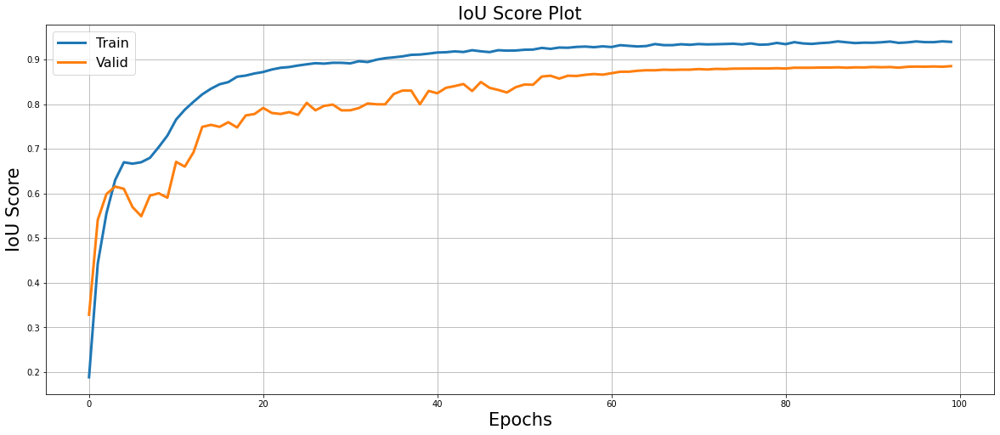

In [ ]:
plt.figure(figsize=(20,8))
plt.plot(train_logs_df.index.tolist(), train_logs_df.iou_score.tolist(), lw=3, label = 'Train')
plt.plot(valid_logs_df.index.tolist(), valid_logs_df.iou_score.tolist(), lw=3, label = 'Valid')
plt.xlabel('Epochs', fontsize=21)
plt.ylabel('IoU Score', fontsize=21)
plt.title('IoU Score Plot', fontsize=21)
plt.legend(loc='best', fontsize=16)
plt.grid()
plt.savefig('iou_score_plot.png')
plt.show()

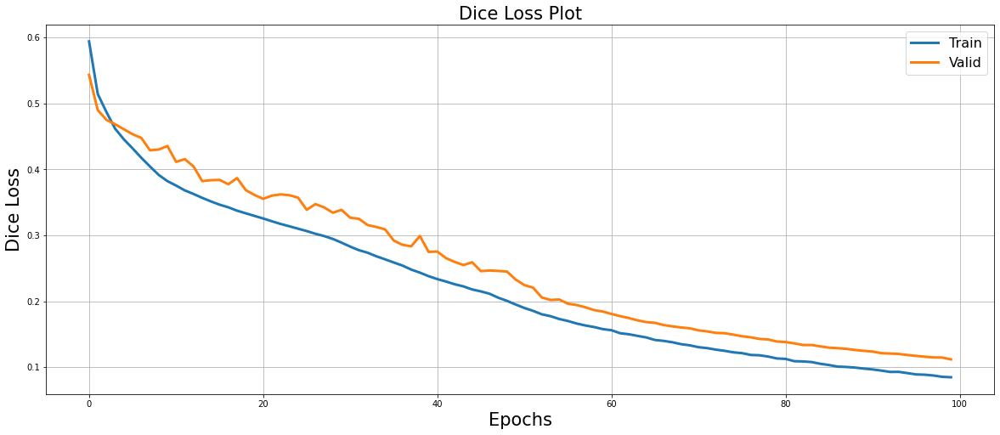

In [ ]:
plt.figure(figsize=(20,8))
plt.plot(train_logs_df.index.tolist(), train_logs_df.dice_loss.tolist(), lw=3, label = 'Train')
plt.plot(valid_logs_df.index.tolist(), valid_logs_df.dice_loss.tolist(), lw=3, label = 'Valid')
plt.xlabel('Epochs', fontsize=21)
plt.ylabel('Dice Loss', fontsize=21)
plt.title('Dice Loss Plot', fontsize=21)
plt.legend(loc='best', fontsize=16)
plt.grid()
plt.savefig('dice_loss_plot.png')
plt.show()

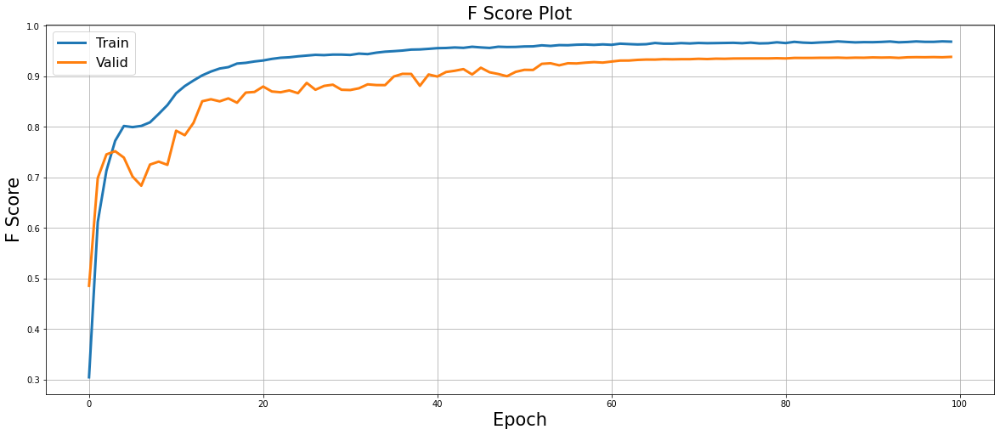

In [ ]:
plt.figure(figsize=(20,8))
plt.plot(train_logs_df.index.tolist(), train_logs_df.fscore.tolist(), lw=3, label = 'Train')
plt.plot(valid_logs_df.index.tolist(), valid_logs_df.fscore.tolist(), lw=3, label = 'Valid')
plt.xlabel('Epoch', fontsize=21)
plt.ylabel('F Score', fontsize=21)
plt.title('F Score Plot', fontsize=21)
plt.legend(loc='best', fontsize=16)
plt.grid()
plt.savefig('fscore.png')
plt.show()

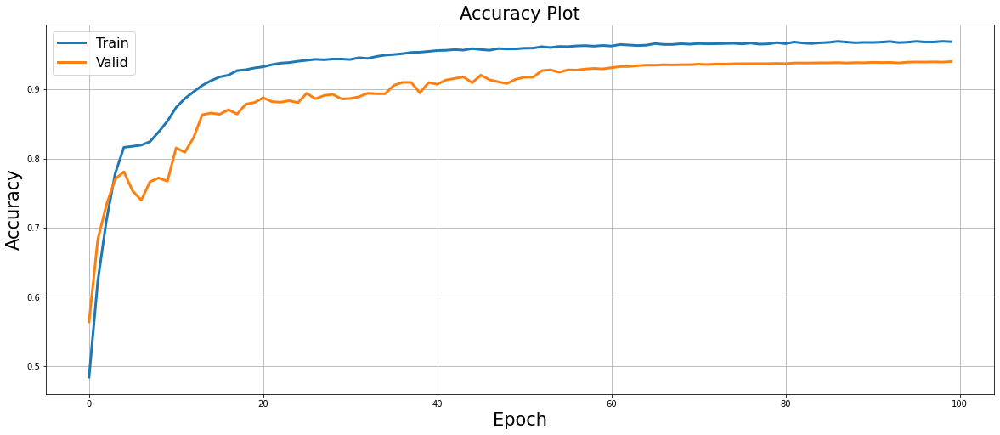

In [ ]:
plt.figure(figsize=(20,8))
plt.plot(train_logs_df.index.tolist(), train_logs_df.accuracy.tolist(), lw=3, label = 'Train')
plt.plot(valid_logs_df.index.tolist(), valid_logs_df.accuracy.tolist(), lw=3, label = 'Valid')
plt.xlabel('Epoch', fontsize=21)
plt.ylabel('Accuracy', fontsize=21)
plt.title('Accuracy Plot', fontsize=21)
plt.legend(loc='best', fontsize=16)
plt.grid()
plt.savefig('accuracy.png')
plt.show()

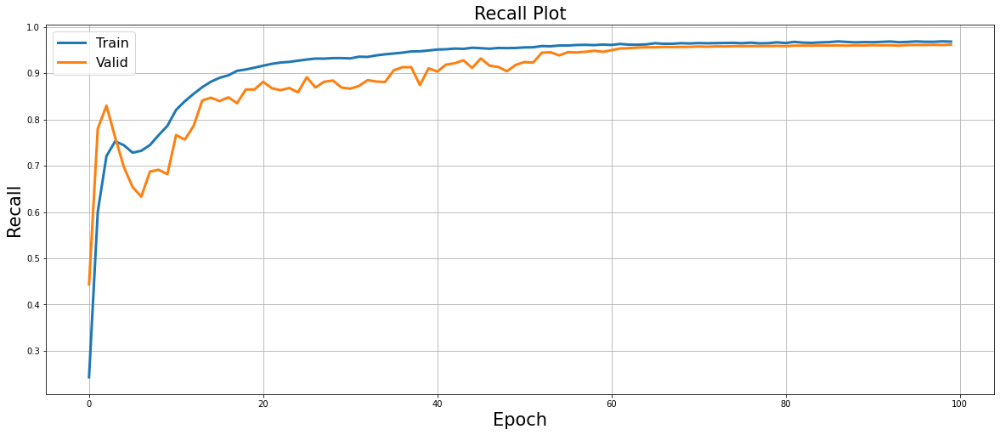

In [ ]:
plt.figure(figsize=(20,8))
plt.plot(train_logs_df.index.tolist(), train_logs_df.recall.tolist(), lw=3, label = 'Train')
plt.plot(valid_logs_df.index.tolist(), valid_logs_df.recall.tolist(), lw=3, label = 'Valid')
plt.xlabel('Epoch', fontsize=21)
plt.ylabel('Recall', fontsize=21)
plt.title('Recall Plot', fontsize=21)
plt.legend(loc='best', fontsize=16)
plt.grid()
plt.savefig('recall.png')
plt.show()

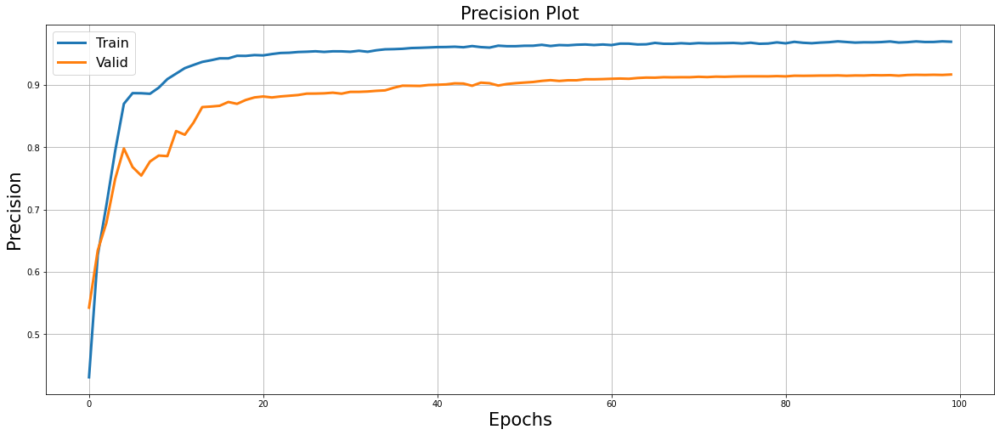

In [ ]:
plt.figure(figsize=(20,8))
plt.plot(train_logs_df.index.tolist(), train_logs_df.precision.tolist(), lw=3, label = 'Train')
plt.plot(valid_logs_df.index.tolist(), valid_logs_df.precision.tolist(), lw=3, label = 'Valid')
plt.xlabel('Epochs', fontsize=21)
plt.ylabel('Precision', fontsize=21)
plt.title('Precision Plot', fontsize=21)
plt.legend(loc='best', fontsize=16)
plt.grid()
plt.savefig('precision.png')
plt.show()